SymPy implementation of the anaytical model for 3-dof training rig

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

import sympy as sp
import random
from datetime import datetime

In [2]:
t = sp.symbols('t')

# Generalized Cordinates
q1 = sp.Function('q1')(t) # Yaw
q2 = sp.Function('q2')(t) # Pitch
q3 = sp.Function('q3')(t) # Roll

# Generalized Cordinate Vector
q = sp.Matrix([q1, q2, q3]) # q
qd = q.diff(t) # qdot

### Coordinate frame convention
(x,y,z): g_vector = [-g, 0, 0]^T

- x: +ve rotation results in yaw

- y: +ve rotation results in pitch (UAV-body goes up against gravity)

- z: +ve rotation results in roll


In [3]:
# Physical scalars
'''
g: acceleration due to gravity
Lb: Distance of the UAV-body from 3ODF arm pivot point
Lc: Distance of the compensator mass from 3ODF arm pivot point
ma: mass of the arm
mb: mass of the UAV-body
mc: mass of the compensator mass
'''
g, ma, mb, mc = sp.symbols('g ma mb mc')

# Legacy straight-arm length scalars kept for reporting/filename metadata
Lb, Lc = sp.symbols('Lb Lc')

In [4]:
# Arm-frame geometry points from 3DOF pivot O_A
# rO_A: arm COM position
# rB_A: body COM/attachment position
# rC_A: compensator COM/attachment position
xO_A, yO_A, zO_A    = sp.symbols('xO_A yO_A zO_A')
xB_A, yB_A, zB_A    = sp.symbols('xB_A yB_A zB_A')
xC_A, yC_A, zC_A    = sp.symbols('xC_A yC_A zC_A')


# Inertia tensors about O_A, expressed in arm frame
# Ia is full symmetric to support bent/non-axisymmetric arm geometry
Iaxx, Iayy, Iazz    = sp.symbols('Iaxx Iayy Iazz')
Iaxy, Iaxz, Iayz    = sp.symbols('Iaxy Iaxz Iayz')
Ibx, Iby, Ibz       = sp.symbols('Ibx Iby Ibz')
Icx, Icy, Icz       = sp.symbols('Icx Icy Icz')


'''
Ib: MOI Matrix of the UAV-body about 3DOF origin in arm-frame components (In principal axis: Ibx Iby Ibz)
Ic: MOI Matrix of the Compensator about 3DOF origin in arm-frame components (In principal axis: Icx Icy Icz)
Ia: MOI Matrix of the Arm about 3DOF origin in arm-frame components (In principal axis: Ia_xx Ia_yy Ia_zz)
'''
Ia = sp.Matrix([
    [Iaxx, Iaxy, Iaxz],
    [Iaxy, Iayy, Iayz],
    [Iaxz, Iayz, Iazz]
    ])
Ib = sp.diag(Ibx, Iby, Ibz)
Ic = sp.diag(Icx, Icy, Icz)

In [5]:
R1 = sp.Matrix([
    [1, 0, 0],
    [0, sp.cos(q1), -sp.sin(q1)],
    [0, sp.sin(q1),  sp.cos(q1)]
])

R2 = sp.Matrix([
    [sp.cos(q2), 0, sp.sin(q2)],
    [0, 1, 0],
    [-sp.sin(q2), 0, sp.cos(q2)]
])

R3 = sp.Matrix([
    [sp.cos(q3), -sp.sin(q3), 0],
    [sp.sin(q3),  sp.cos(q3), 0],
    [0, 0, 1]
])

# Cosie-Matrix: C_{NA}
# C = R1 * R2 * R3 # -> is C_{AN} 
# Hence C.T = R3 * R2 * R1 -> is C_{NA}
C = R3 * R2 * R1 

# # print: C_AN
C
# # print: C_NA
# C.T

Matrix([
[cos(q2(t))*cos(q3(t)), sin(q1(t))*sin(q2(t))*cos(q3(t)) - sin(q3(t))*cos(q1(t)),  sin(q1(t))*sin(q3(t)) + sin(q2(t))*cos(q1(t))*cos(q3(t))],
[sin(q3(t))*cos(q2(t)), sin(q1(t))*sin(q2(t))*sin(q3(t)) + cos(q1(t))*cos(q3(t)), -sin(q1(t))*cos(q3(t)) + sin(q2(t))*sin(q3(t))*cos(q1(t))],
[          -sin(q2(t)),                                    sin(q1(t))*cos(q2(t)),                                     cos(q1(t))*cos(q2(t))]])

#### Angular velocities

\begin{align*}
    \begin{bmatrix} \tilde{\omega} \end{bmatrix}^{Arm} &=
    \begin{bmatrix} C_{NA} \end{bmatrix}^{T} \begin{bmatrix} \dot{C}_{NA} \end{bmatrix}\\
    \begin{bmatrix} \tilde{\omega} \end{bmatrix}^{N(inertial)} &=
    \begin{bmatrix} C_{NA} \end{bmatrix} \begin{bmatrix} \tilde{\omega} \end{bmatrix}^{Arm} \begin{bmatrix} C_{NA} \end{bmatrix}^{T}\\ &= 
    \begin{bmatrix} \dot{C}_{NA} \end{bmatrix} \begin{bmatrix} C_{NA} \end{bmatrix}^{T}
\end{align*}

---

\begin{equation*}
    \begin{bmatrix} \tilde{\omega} \end{bmatrix}^{any} = 
    \begin{bmatrix} 
        0 & -\omega_z & \omega_y \\
        \omega_z & 0 & -\omega_x \\
        -\omega_y & \omega_x & 0
    \end{bmatrix}
\end{equation*}

\begin{equation*}
    \mathbf{\omega}^{any} = 
    \begin{bmatrix}
        \begin{bmatrix} \tilde{\omega} \end{bmatrix}_{[3,2]} \\ \begin{bmatrix} \tilde{\omega} \end{bmatrix}_{[1,3]} \\ \begin{bmatrix} \tilde{\omega} \end{bmatrix}_{[2,1]}
    \end{bmatrix}
\end{equation*}



In [6]:
def vee(S):
    return sp.Matrix([S[2,1], S[0,2], S[1,0]])

# CONFUSION!: Here we are considering that C is C_NA but the form looks like C_AN
omega_A = vee(C.T * C.diff(t))         # angular velocity of arm w.r.t to O_N written in arm-frame components
omega_N = C * omega_A                  # angular velocity of arm w.r.t to O_N written in inertial-frame components

B = omega_A.jacobian(qd)               # omega_A = B * qd
B.simplify()
B

Matrix([
[1,           0,           -sin(q2(t))],
[0,  cos(q1(t)), sin(q1(t))*cos(q2(t))],
[0, -sin(q1(t)), cos(q1(t))*cos(q2(t))]])

In [7]:
# Position vectors of COM/attachment points in arm-frame
rO_A = sp.Matrix([xO_A, yO_A, zO_A])    # position vector of arm-CG from origin/3DOF joint in arm-frame components
rB_A = sp.Matrix([xB_A, yB_A, zB_A])    # position vector of body-CG from origin/3DOF joint in arm-frame components
rC_A = sp.Matrix([xC_A, yC_A, zC_A])    # position vector of compensator-CG from origin/3DOF joint in arm-frame componentsin arm-frame components

# Transform to inertial frame: C = C_{NA}
rO = C * rO_A
rB = C * rB_A
rC = C * rC_A

# Translational velocity vectors of each body in inertial-frame components: omega x r
vO_cross = omega_N.cross(rO)
vB_cross = omega_N.cross(rB)
vC_cross = omega_N.cross(rC)

# Total velocity
vO = rO.diff(t)
vB = rB.diff(t)
vC = rC.diff(t)

> ### Sanity Check - 1

\begin{equation*}
    \frac{dr^{N}}{dt} = \frac{dr^{A}}{dt} \hspace{1pt} + \hspace{1pt} \omega \times r \hspace{1pt}
\end{equation*}

**Kineamatic Residual**: All translational velocity in arm-fram is zero

\begin{align*}
    \frac{dr^{N}}{dt} - \hspace{1pt} \omega \times r \hspace{1pt} = 0
\end{align*}

In [8]:
# Numerical sanity check for kinematics residual
# (symbolic printouts may not look simplified to exact zeros)

samples = []

# Avoid dependence on global variable name `t`
t_sym = next(iter(q1.free_symbols))

kinematics_residual = sp.Matrix.vstack(
    vO - vO_cross,
    vB - vB_cross,
    vC - vC_cross
)
for _ in range(5):
    subs = {
        q1: random.uniform(-1.2, 1.2),
        q2: random.uniform(-1.0, 1.0),
        q3: random.uniform(-1.2, 1.2),
        sp.diff(q1, t_sym): random.uniform(-1.0, 1.0),
        sp.diff(q2, t_sym): random.uniform(-1.0, 1.0),
        sp.diff(q3, t_sym): random.uniform(-1.0, 1.0),
        xO_A: -0.03,    yO_A: 0.00,     zO_A: -0.06,
        xB_A: 0.00,     yB_A: 0.00,     zB_A: 0.12,
        xC_A: 0.00,     yC_A: 0.00,     zC_A: -0.30,
    }
    r = kinematics_residual.subs(subs).evalf()
    samples.append(max(abs(float(v)) for v in r))
    
print('Max abs kinematics residual per sample:')
print(samples)
print('\nWorst-case residual:', max(samples))


Max abs kinematics residual per sample:
[1.3322676295501878e-16, 3.3306690738754695e-17, 3.747002708109903e-17, 4.996003610813204e-17, 1.6653345369377347e-17]

Worst-case residual: 1.3322676295501878e-16


In [9]:
# # Instead of checking using Kinematic Residual 
# # we just simplify and check term by term equality:
# print(vO.simplify() == vO_cross.simplify())
# print(vB.simplify() == vB_cross.simplify())
# print(vC.simplify() == vC_cross.simplify())

In [10]:
#------------------------------------------------
# KINETIC ENERGY TERMS
#------------------------------------------------

T_trans = (
    sp.Rational(1,2)*ma*(vO.dot(vO)) +
    sp.Rational(1,2)*mb*(vB.dot(vB)) +
    sp.Rational(1,2)*mc*(vC.dot(vC))
)


T_rot = (
    sp.Rational(1,2)*(omega_A.T * Ia * omega_A)[0] + 
    sp.Rational(1,2)*(omega_A.T * Ib * omega_A)[0] +
    sp.Rational(1,2)*(omega_A.T * Ic * omega_A)[0]
)

# Every term is in inertial frame components
K = T_trans + T_rot

> ### Sanity Check - 3

In [11]:
T_rot_test = (
    sp.Rational(1,2)*(omega_N.T * C * Ia * C.T * omega_N)[0] + 
    sp.Rational(1,2)*(omega_N.T * C * Ib * C.T * omega_N)[0] +
    sp.Rational(1,2)*(omega_N.T * C * Ic * C.T * omega_N)[0]
)

In [12]:
# If this is zero then we verify that Energy is invariant under orthogonal rotations
# sp.simplify(T_rot - T_rot_test)

In [13]:
#------------------------------------------------
# POTENTIAL ENERGY TERMS
#------------------------------------------------
'''
Potential energy should be purely function q_vector
Hence, setting 
q_vec(0) = [0, 0, 0]^T 
should give zero potential 
'''
# Acceleration due to gravity vector: g is in -ve X-axis in inertial frame
gvec = sp.Matrix([-g, 0, 0])

# Gravitational potential V satisfies F = -grad(V), with F = m*gvec
# hence V = -m*(gvec.dot(r))
P = -(
    ma*(gvec.dot(rO)) +
    mb*(gvec.dot(rB)) +
    mc*(gvec.dot(rC))
)

In [14]:
#------------------------------------------------
# GENERALIZED FORCE TERMS
#------------------------------------------------
'''
Generalize force term is finally a function of q_vec and not q_dot
'''

# External wrench input (applied on point B (UAV-body)): torque + force in body-frame
tau1, tau2, tau3    = sp.symbols('tau1 tau2 tau3')
Fx, Fy, Fz          = sp.symbols('Fx Fy Fz')


# Default sanity-check case: zero external wrench
# tau_A   = sp.Matrix([0.2, 0.0, 0.0]) # sp.Matrix([tau1, tau2, tau3])
# F_A     = sp.Matrix([0.0, 0.2, 0.0]) # sp.Matrix([Fx, Fy, Fz])

tau_A = sp.Matrix([tau1, tau2, tau3])
F_A   = sp.Matrix([Fx, Fy, Fz])

# To enable forcing with numbers, e.g. tau_A = sp.Matrix([0.1, 0, 0]), F_A = sp.Matrix([0, 0, 0])
# Keep tau_A/F_A numeric for simulation.

# Generalized torque contribution
Q_tau = B.T * tau_A

# Generalized force contribution from force applied at point B
Jv_B = vB.jacobian(qd)
F_N = C * F_A
Q_force = Jv_B.T * F_N

# Every term is in inertial frame components
Q = Q_tau + Q_force

print('\nMeaning of external wrench in this model:')
print('tau_A = [tau1, tau2, tau3]^T is body-frame applied torque.')
print('F_A = [Fx, Fy, Fz]^T is body-frame applied force at point B.')
print('\nGeneralized forcing enters as Q = B.T*tau_A + Jv_B.T*(C*F_A).')


Meaning of external wrench in this model:
tau_A = [tau1, tau2, tau3]^T is body-frame applied torque.
F_A = [Fx, Fy, Fz]^T is body-frame applied force at point B.

Generalized forcing enters as Q = B.T*tau_A + Jv_B.T*(C*F_A).


> ### Sanity Check-3

In [15]:
Q_force.simplify()
Q_force

Matrix([
[                                                                                                                                                      -Fy*zB_A + Fz*yB_A],
[                                                                                       Fx*yB_A*sin(q1(t)) + Fx*zB_A*cos(q1(t)) - Fy*xB_A*sin(q1(t)) - Fz*xB_A*cos(q1(t))],
[-Fx*yB_A*cos(q1(t))*cos(q2(t)) + Fx*zB_A*sin(q1(t))*cos(q2(t)) + Fy*xB_A*cos(q1(t))*cos(q2(t)) + Fy*zB_A*sin(q2(t)) - Fz*xB_A*sin(q1(t))*cos(q2(t)) - Fz*yB_A*sin(q2(t))]])

In [16]:
# Force and the position vector here should be in arm-frame for this equation to be valid
test = B.T * (rB_A.cross(F_A)) 
test.simplify()
test

Matrix([
[                                                                                                     -Fy*zB_A + Fz*yB_A],
[                                                        (Fx*yB_A - Fy*xB_A)*sin(q1(t)) + (Fx*zB_A - Fz*xB_A)*cos(q1(t))],
[(-Fx*yB_A + Fy*xB_A)*cos(q1(t))*cos(q2(t)) + (Fx*zB_A - Fz*xB_A)*sin(q1(t))*cos(q2(t)) + (Fy*zB_A - Fz*yB_A)*sin(q2(t))]])

In [17]:
print(Q_force == test)

False


In [18]:
#-------------------------------------------------------------
# EULER-LAGRANGE WITH GENERALIZED FORCE IN MATRIX FORMULATION 
#-------------------------------------------------------------

# Lagrangian of the system
L = K - P


EL = []
for i, qi in enumerate(q):
    # dL/dq_dot
    dLdqdot = sp.diff(L, sp.diff(qi, t))
    # d/dt(dL/dq_dot)
    d_dt = sp.diff(dLdqdot, t)
    # dL/dq
    dLdq = sp.diff(L, qi)
    # d/dt(dL/dq_dot) - dL/dq = 0 -> EL Matrix formulation
    EL.append(d_dt - dLdq)

EL = sp.Matrix(EL)

# print("Kinematics residual (should be all zeros):")
# sp.pprint(kinematics_residual)
print("\nEuler-Lagrange residual equations (EL = 0):")
sp.pprint(EL)


Euler-Lagrange residual equations (EL = 0):
⎡                                                                             
⎢                                                                             
⎢                                                                             
⎢                                                                             
⎢                                                                             
⎢                                                                             
⎢                                                                             
⎢                                                                             
⎢                                                                             
⎢                                                                             
⎢      ⎛                                                           ⎛          
⎢  Ibx⋅⎜(sin(q₁(t))⋅sin(q₃(t)) + sin(q₂(t))⋅cos(q₁(t))⋅cos(q₃(t)))⋅⎜- sin(q₁(t
⎢      

### 3D Visualization

In [19]:
# 3D visualization driven by solved dynamics (uses EL and current wrench setting (tau_A, F_A))
# Build numerical dynamics from EL(q, qd, qdd) = 0
q1_s, q2_s, q3_s        = sp.symbols('q1_s q2_s q3_s', real=True)
q1d_s, q2d_s, q3d_s     = sp.symbols('q1d_s q2d_s q3d_s', real=True)
q1dd_s, q2dd_s, q3dd_s  = sp.symbols('q1dd_s q2dd_s q3dd_s', real=True)

# Avoid dependence on global variable name `t` (which can be overwritten in later cells)
t_sym = next(iter(q1.free_symbols))

subs_dyn = {
    q1: q1_s,
    q2: q2_s,
    q3: q3_s,
    sp.diff(q1, t_sym): q1d_s,
    sp.diff(q2, t_sym): q2d_s,
    sp.diff(q3, t_sym): q3d_s,
    sp.diff(q1, (t_sym, 2)): q1dd_s,
    sp.diff(q2, (t_sym, 2)): q2dd_s,
    sp.diff(q3, (t_sym, 2)): q3dd_s
}

EL_alg = sp.Matrix([expr.subs(subs_dyn) for expr in EL])
qdd_sym = sp.Matrix([q1dd_s, q2dd_s, q3dd_s])

# Extracting M and h from EL equation: EL = M(q)*q_ddot + h(q,q_dot) = Q
# Since EL-Q is linear in q_ddot we can seperate M(q) by taking jacobian
M_sym = EL_alg.jacobian(qdd_sym)

# Setting accelerations to zero isolates h(q,q_dot) -> h dosen't include Q(q)
h_sym = EL_alg.subs({q1dd_s: 0, q2dd_s: 0, q3dd_s: 0})
Q_alg = Q.subs(subs_dyn)

In [20]:
# LAMBDIFICATION: Convert symbolic expression -> fast numpy fuctions
dyn_args = (
    q1_s, q2_s, q3_s, q1d_s, q2d_s, q3d_s,
    g, ma, mb, mc,
    Iaxx, Iayy, Iazz, Iaxy, Iaxz, Iayz,
    Ibx, Iby, Ibz, Icx, Icy, Icz,
    xO_A, yO_A, zO_A, xB_A, yB_A, zB_A, xC_A, yC_A, zC_A,
    tau1, tau2, tau3, Fx, Fy, Fz
)

M_func  = sp.lambdify(dyn_args, M_sym, 'numpy')
h_func  = sp.lambdify(dyn_args, h_sym, 'numpy')
Q_func  = sp.lambdify(dyn_args, Q_alg, 'numpy')

In [21]:
# PLOYLINE INERTIAL MODEL: Approximates arm as a piecewise slender rod 
def polyline_mass_properties_about_origin(nodes_A, total_mass):
    # Uniform linear density over connected rod segments
    seg     = nodes_A[1:] - nodes_A[:-1]
    seg_len = np.linalg.norm(seg, axis=1)
    L_total = float(np.sum(seg_len))

    if L_total <= 0.0:
        raise ValueError('WARNING: Polyline total length must be positive.')
    
    I3  = np.eye(3)
    I_O = np.zeros((3, 3))
    com = np.zeros(3)
    for a, b, L in zip(nodes_A[:-1], nodes_A[1:], seg_len):
        '''
        a: pos-vector of one end of a segment length close to origin
        b: pos-vector of another end of a segement length farther to origin
        L: length of the line-segment = norm(b-a)
        L_total: Total-length of the entire arm
        total_mass: total mass of the arm
        '''
        if L <= 1e-12:
            continue
        # Uniform linear density:
        # m_i: mass of ith segment
        # u_i: direction of the ith com w.r.t. origin
        # c_i: com of ith segemnet 
        m_i =  L * (total_mass/ L_total)
        u = (b - a) / L
        c_i = 0.5 * (a + b)
        # Slender segment inertia about its own COM
        I_com_i = (m_i * L**2 / 12.0) * (I3 - np.outer(u, u))
        # Parallel-axis theorem: Shift COM -> origin O_A
        I_shift_i = m_i * ((np.dot(c_i, c_i) * I3) - np.outer(c_i, c_i))
        # Total MOI and COM:
        I_O += I_com_i + I_shift_i
        com += m_i * c_i
    
    com /= total_mass
    return com, I_O, seg_len

In [80]:
# Example parameters
params = {
    'g': 9.81,
    'ma': 2.0,
    'mb': 2.2,#2.2,
    'mc': 1.3,
    # Body and compensator inertia about O_A in arm frame (diag approximation)
    'Ibx': 0.030,
    'Iby': 0.025,
    'Ibz': 0.020,
    'Icx': 0.030,
    'Icy': 0.025,
    'Icz': 0.020,
    # External wrench values in arm frame (edit these directly)
    'tau_A_const': [0.0, 0.0, 0.0],
    'F_A_const': [0.0, 0.0, 10.0],
}
# --- Arm geometry from sketch (meters) ---
# Using model frame where +X is vertical (gravity is along -X), Y out of plane, Z horizontal.
mm = 1e-3
L_tail = 300.0 * mm
L_diag = 172.71 * mm
L_bot  = 60.0 * mm
L_vert = 162.0 * mm
# Geometry points in a sketch reference frame R (knee at z=0)
p_tail_R = np.array([0.0, 0.0, -L_tail])
p_knee_R = np.array([0.0, 0.0, 0.0])
p_k1_R   = np.array([-L_vert, 0.0,  L_bot])
p_k2_R   = np.array([-L_vert, 0.0, 2.0 * L_bot])
p_body_R = np.array([0.0, 0.0, 2.0 * L_bot])
# Shift 3DOF anchor O_A a little to the LEFT of system COM (along -Z in model frame)
# This addresses your request that anchor be left of COM, not right.
oa_shift_left = 40.0 * mm # 40.0
p_OA_R = p_knee_R + np.array([0.0, 0.0, -oa_shift_left])
# Express all points in arm frame A (origin at O_A)
p_tail = p_tail_R - p_OA_R
p_knee = p_knee_R - p_OA_R
p_OA   = p_OA_R - p_OA_R
p_k1   = p_k1_R - p_OA_R
p_k2   = p_k2_R - p_OA_R
p_body = p_body_R - p_OA_R
# Keep full arm geometry (tail -> knee -> lower-knee -> right-bottom -> body)
arm_nodes_A = np.vstack([p_tail, p_knee, p_k1, p_k2, p_body])
# Consistency check against sketched diagonal length (knee -> lower-knee)
L_diag_check = float(np.linalg.norm(p_k1_R - p_knee_R))
if abs(L_diag_check - L_diag) > 5e-4:
    print('Warning: diagonal length check mismatch:', L_diag_check, 'vs', L_diag)
# Compute arm COM and inertia tensor from bent polyline
com_A, Ia_OA, seg_lengths = polyline_mass_properties_about_origin(arm_nodes_A, params['ma'])
params['xO_A'], params['yO_A'], params['zO_A'] = com_A.tolist()
params['xB_A'], params['yB_A'], params['zB_A'] = p_body.tolist()
params['xC_A'], params['yC_A'], params['zC_A'] = p_tail.tolist()
# Full system COM in arm frame (arm + body + compensator)
m_total = params['ma'] + params['mb'] + params['mc']
com_sys_A = (
    params['ma'] * np.array([params['xO_A'], params['yO_A'], params['zO_A']]) +
    params['mb'] * np.array([params['xB_A'], params['yB_A'], params['zB_A']]) +
    params['mc'] * np.array([params['xC_A'], params['yC_A'], params['zC_A']])
) / m_total
params['xG_A'], params['yG_A'], params['zG_A'] = com_sys_A.tolist()
params['Iaxx'] = float(Ia_OA[0, 0])
params['Iayy'] = float(Ia_OA[1, 1])
params['Iazz'] = float(Ia_OA[2, 2])
params['Iaxy'] = float(Ia_OA[0, 1])
params['Iaxz'] = float(Ia_OA[0, 2])
params['Iayz'] = float(Ia_OA[1, 2])

# Legacy convenience scalars
params['Lb'] = float(np.linalg.norm(p_body - p_OA))
params['Lc'] = float(np.linalg.norm(p_tail - p_OA))

print('1. Arm segment lengths [m]:\n', seg_lengths)
print('\n2. Top section split by anchor [m]: left=\n', np.linalg.norm(p_tail - p_OA), ', right=', np.linalg.norm(p_knee - p_OA))
print('\n3. Arm COM in A-frame [m]:\n', com_A)
print('\n4. System COM in A-frame [m] (ma,mb,mc all included):\n', com_sys_A)
print('\n5. Interpretation: +z means COM is to the RIGHT of anchor O_A.')
print('\n6. Arm inertia Ia about O_A [kg*m^2]:\n', Ia_OA)

1. Arm segment lengths [m]:
 [0.3        0.17275416 0.06       0.162     ]

2. Top section split by anchor [m]: left=
 0.26 , right= 0.04

3. Arm COM in A-frame [m]:
 [-0.05301888  0.          0.01844219]

4. System COM in A-frame [m] (ma,mb,mc all included):
 [-0.01927959  0.          0.00925171]

5. Interpretation: +z means COM is to the RIGHT of anchor O_A.

6. Arm inertia Ia about O_A [kg*m^2]:
 [[0.03442231 0.         0.01290404]
 [0.         0.04738537 0.        ]
 [0.01290404 0.         0.01296306]]


In [81]:

def tau_A_numeric(t):
    # [arm-frame x, y, z] external torque
    return np.array(params['tau_A_const'], dtype=float)
    # return np.array([1*np.sin(t), 0.0, 0.0], dtype=float)

def F_A_numeric(t):
    # [arm-frame x, y, z] external force applied at point B
    return np.array(params['F_A_const'], dtype=float)
    # return np.array([1*np.sin(t), 1.0, 0.0], dtype=float)

def qdd_eval(state, t_current):
    qv = state[:3]
    qdv = state[3:]
    tauA = tau_A_numeric(t_current)
    FA   = F_A_numeric(t_current)
    vals = (
        qv[0], qv[1], qv[2], qdv[0], qdv[1], qdv[2],
        params['g'], params['ma'], params['mb'], params['mc'],
        params['Iaxx'], params['Iayy'], params['Iazz'], params['Iaxy'], params['Iaxz'], params['Iayz'],
        params['Ibx'], params['Iby'], params['Ibz'], params['Icx'], params['Icy'], params['Icz'],
        params['xO_A'], params['yO_A'], params['zO_A'],
        params['xB_A'], params['yB_A'], params['zB_A'],
        params['xC_A'], params['yC_A'], params['zC_A'],
        tauA[0], tauA[1], tauA[2], FA[0], FA[1], FA[2]
    )
    M1 = np.array(M_func(*vals), dtype=float)
    h1 = np.array(h_func(*vals), dtype=float).reshape(3)
    Q1 = np.array(Q_func(*vals), dtype=float).reshape(3)
    cond = np.linalg.cond(M1)
    if cond > 1e12:
        print('Warning: Ill-conditioned mass matrix:', cond)
    try:
        return np.linalg.solve(M1, Q1 - h1)
    except np.linalg.LinAlgError:
        print('>> Tikhonov regularization imposed <<')
        return np.linalg.solve(M1 + 1e-9 * np.eye(3), Q1 - h1)
def f_state(state, t_current):
    return np.hstack([state[3:], qdd_eval(state, t_current)])
# Simulate
dt = 0.01
T = 6.0
time_viz = np.arange(0.0, T + dt, dt)
N = len(time_viz)
# RK4 integration
traj = np.zeros((N, 6))
# Start near horizontal top profile with small perturbation in pitch
traj[0] = np.array([0.0, np.deg2rad(2.0), 0.0, 0.0, 0.0, 0.0])
for i in range(N - 1):
    t_i = time_viz[i]
    x = traj[i]
    k1 = f_state(x, t_i)
    k2 = f_state(x + 0.5 * dt * k1, t_i + 0.5 * dt)
    k3 = f_state(x + 0.5 * dt * k2, t_i + 0.5 * dt)
    k4 = f_state(x + dt * k3, t_i + dt)
    traj[i + 1] = x + (dt / 6.0) * (k1 + 2 * k2 + 2 * k3 + k4)


In [82]:
def C_num(q1n, q2n, q3n):
    c1, s1 = np.cos(q1n), np.sin(q1n)
    c2, s2 = np.cos(q2n), np.sin(q2n)
    c3, s3 = np.cos(q3n), np.sin(q3n)
    R1n = np.array([
        [1, 0, 0],
        [0, c1, -s1],
        [0, s1,  c1]
    ])
    R2n = np.array([
        [ c2, 0, s2],
        [ 0,  1, 0 ],
        [-s2, 0, c2]
    ])
    R3n = np.array([
        [c3, -s3, 0],
        [s3,  c3, 0],
        [0,   0,  1]
    ])
    return R3n @ R2n @ R1n

In [83]:
q1_v = traj[:, 0]
q2_v = traj[:, 1]
q3_v = traj[:, 2]

def to_plot(p_model):
    # Display mapping [Y, Z, X] so gravity (-X in model) appears downward in plot-Z.
    return np.array([p_model[1], p_model[2], p_model[0]], dtype=float)

fig = plt.figure(figsize=(7, 6))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlim(-0.45, 0.45)
ax.set_ylim(-0.45, 0.45)
ax.set_zlim(-0.45, 0.45)
ax.set_box_aspect((1, 1, 1))
ax.set_xlabel('Y (model) [m]')
ax.set_ylabel('Z (model) [m]')
ax.set_zlabel('X (model, vertical) [m]')
ax.view_init(elev=20, azim=-35)
# Fixed base axes in model frame, displayed via to_plot mapping
origin = np.zeros(3)
axis_scale = 0.20
o = to_plot(origin)
x_end = to_plot(np.array([axis_scale, 0.0, 0.0]))
y_end = to_plot(np.array([0.0, axis_scale, 0.0]))
z_end = to_plot(np.array([0.0, 0.0, axis_scale]))
ax.plot([o[0], x_end[0]], [o[1], x_end[1]], [o[2], x_end[2]], 'r-', lw=2)
ax.plot([o[0], y_end[0]], [o[1], y_end[1]], [o[2], y_end[2]], 'g-', lw=2)
ax.plot([o[0], z_end[0]], [o[1], z_end[1]], [o[2], z_end[2]], 'b-', lw=2)
# Gravity direction in displayed coordinates
ax.quiver(o[0], o[1], o[2], 0.0, 0.0, -0.12, color='grey', linewidth=2, arrow_length_ratio=0.2)
ax.text(o[0], o[1], o[2] - 0.16, 'gravity', color='k')
rod_line, = ax.plot([], [], [], color='k', lw=3, label='Bent arm')
mass_b, = ax.plot([], [], [], 'o', color='tab:blue', markersize=7, label='UAV-body')
mass_c, = ax.plot([], [], [], 'o', color='tab:red', markersize=7, label='Compensator-mass')
com_point, = ax.plot([], [], [], 'o', color='tab:purple', markersize=6, label='System COM')
ax.legend(handles=[rod_line, mass_b, mass_c, com_point], loc='upper left', framealpha=0)
# inside legend ... ,
com_sys_A_num = np.array([params['xG_A'], params['yG_A'], params['zG_A']], dtype=float)


def init_anim():
    rod_line.set_data([], [])
    rod_line.set_3d_properties([])
    mass_b.set_data([], [])
    mass_b.set_3d_properties([])
    mass_c.set_data([], [])
    mass_c.set_3d_properties([])
    com_point.set_data([], [])
    com_point.set_3d_properties([])
    return rod_line, mass_b, mass_c, com_point


def update_anim(k):
    
    Ck = C_num(q1_v[k], q2_v[k], q3_v[k])
    nodes_N = (Ck @ arm_nodes_A.T).T
    nodes_plot = np.array([to_plot(p) for p in nodes_N])
    rod_line.set_data(nodes_plot[:, 0], nodes_plot[:, 1])
    rod_line.set_3d_properties(nodes_plot[:, 2])
    p_b_plot = nodes_plot[-1]
    p_c_plot = nodes_plot[0]
    p_g = Ck @ com_sys_A_num
    p_g_plot = to_plot(p_g)
    mass_b.set_data([p_b_plot[0]], [p_b_plot[1]])
    mass_b.set_3d_properties([p_b_plot[2]])
    mass_c.set_data([p_c_plot[0]], [p_c_plot[1]])
    mass_c.set_3d_properties([p_c_plot[2]])
    com_point.set_data([p_g_plot[0]], [p_g_plot[1]])
    com_point.set_3d_properties([p_g_plot[2]])
    q1_deg = np.degrees(q1_v[k])
    q2_deg = np.degrees(q2_v[k])
    q3_deg = np.degrees(q3_v[k])
    ax.set_title(f'q1={q1_deg:+.1f} deg, q2={q2_deg:+.1f} deg, q3={q3_deg:+.1f} deg')
    return rod_line, mass_b, mass_c, com_point


ani = FuncAnimation(
    fig,
    update_anim,
    frames=range(0, len(time_viz), 8),
    init_func=init_anim,
    interval=80,
    blit=False
)
# Save animation as video file (MP4)
video_file = f"3dof_sympy_3_anim_{datetime.now().strftime('%Y%m%d_%H%M%S')}.mp4"
try:
    ani.save(video_file, writer='ffmpeg', fps=12)
    print(f"Saved animation video: {video_file}")
except Exception as e:
    print(f"Could not save MP4: {e}")
    print("Install ffmpeg and rerun this cell to export video.")
plt.close(fig)
HTML(ani.to_jshtml())


MovieWriter ffmpeg unavailable; using Pillow instead.


Could not save MP4: unknown file extension: .mp4
Install ffmpeg and rerun this cell to export video.


Max |EL residual| per equation: [0.00000000e+00 5.55111512e-16 0.00000000e+00]
Max |EL residual| overall     : 5.551115123125783e-16
PASS: residuals are below tolerance (1e-06). Dynamics is consistent with EL implementation.


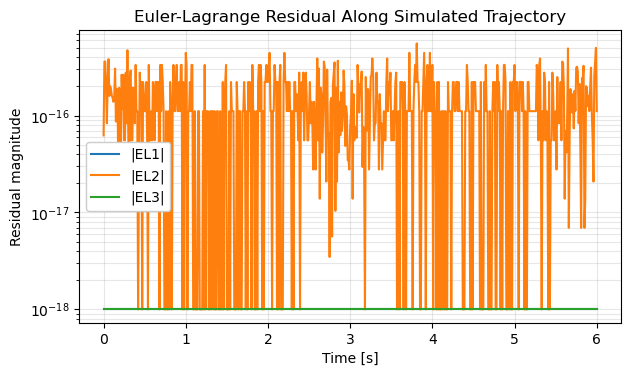

In [84]:
# EL implementation sanity check on the simulated trajectory
# Run this after the dynamics+animation cell above.
import numpy as np
import matplotlib.pyplot as plt

EL_minus_Q = EL_alg - Q_alg
EL_func = sp.lambdify(dyn_args + (q1dd_s, q2dd_s, q3dd_s), EL_minus_Q, 'numpy')

residuals = np.zeros((len(time_viz), 3), dtype=float)

for k, state in enumerate(traj):
    t_current = time_viz[k]

    # compute accelerations
    qdd_k = qdd_eval(state, t_current)

    # compute forcing at same time
    tauA = tau_A_numeric(t_current)
    FA   = F_A_numeric(t_current)

    vals = (
        state[0], state[1], state[2], state[3], state[4], state[5],
        params['g'], params['ma'], params['mb'], params['mc'],
        params['Iaxx'], params['Iayy'], params['Iazz'], params['Iaxy'], params['Iaxz'], params['Iayz'],
        params['Ibx'], params['Iby'], params['Ibz'], params['Icx'], params['Icy'], params['Icz'],
        params['xO_A'], params['yO_A'], params['zO_A'],
        params['xB_A'], params['yB_A'], params['zB_A'],
        params['xC_A'], params['yC_A'], params['zC_A'],
        tauA[0], tauA[1], tauA[2], FA[0], FA[1], FA[2],
        qdd_k[0], qdd_k[1], qdd_k[2]
    )

    residuals[k] = np.array(EL_func(*vals), dtype=float).reshape(3)

max_abs_each = np.max(np.abs(residuals), axis=0)
max_abs_all = float(np.max(np.abs(residuals)))

print('Max |EL residual| per equation:', max_abs_each)
print('Max |EL residual| overall     :', max_abs_all)

tol = 1e-6
if max_abs_all < tol:
    print(f'PASS: residuals are below tolerance ({tol}). Dynamics is consistent with EL implementation.')
else:
    print(f'WARN: residual exceeds tolerance ({tol}). Check model/solver settings.')

fig, ax = plt.subplots(figsize=(7, 3.8))
ax.semilogy(time_viz, np.maximum(np.abs(residuals[:, 0]), 1e-18), label='|EL1|')
ax.semilogy(time_viz, np.maximum(np.abs(residuals[:, 1]), 1e-18), label='|EL2|')
ax.semilogy(time_viz, np.maximum(np.abs(residuals[:, 2]), 1e-18), label='|EL3|')
ax.set_xlabel('Time [s]')
ax.set_ylabel('Residual magnitude')
ax.set_title('Euler-Lagrange Residual Along Simulated Trajectory')
ax.grid(True, which='both', alpha=0.3)
ax.legend(framealpha=1)
plt.show()


In [85]:
F_applied, tau_applied = [], []
for t_i in time_viz:
    F_applied.append(F_A_numeric(t_i))
    tau_applied.append(tau_A_numeric(t_i))
F_applied   = np.array(F_applied)
tau_applied = np.array(tau_applied)
print(F_applied.shape, time_viz.shape)
print(tau_applied.shape, time_viz.shape)


(601, 3) (601,)
(601, 3) (601,)


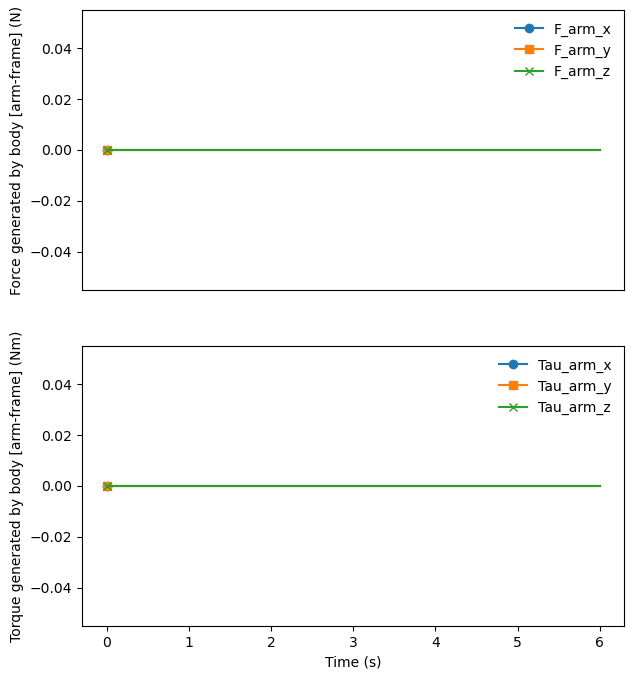

In [ ]:
mark_every = 1000

plt.figure(figsize=(7,8))
plt.subplot(2,1,1)
plt.plot(time_viz, F_applied[:,0], marker="o", markevery=mark_every, label="F_arm_x")
plt.plot(time_viz, F_applied[:,1], marker="s", markevery=mark_every, label="F_arm_y")
plt.plot(time_viz, F_applied[:,2], marker="x", markevery=mark_every, label="F_arm_z")
plt.legend(framealpha=0)
plt.ylabel("Force generated by body [arm-frame] (N)")
plt.xticks([])


plt.subplot(2,1,2)
plt.plot(time_viz, tau_applied[:,0], marker="o", markevery=mark_every, label="Tau_arm_x")
plt.plot(time_viz, tau_applied[:,1], marker="s", markevery=mark_every, label="Tau_arm_y")
plt.plot(time_viz, tau_applied[:,2], marker="x", markevery=mark_every, label="Tau_arm_z")
plt.legend(framealpha=0)
plt.xlabel("Time (s)")
plt.ylabel("Torque generated by body [arm-frame] (Nm)")

plt.show()


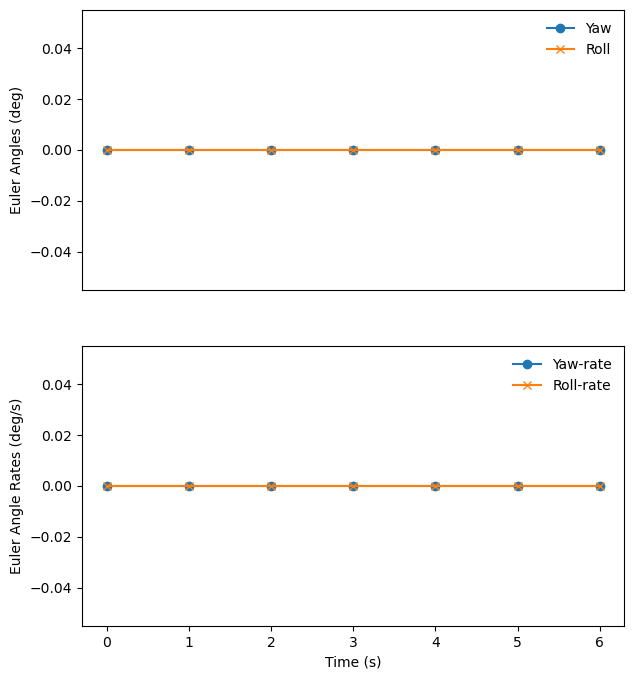

In [ ]:
mark_every = 100

plt.figure(figsize=(7,8))
plt.subplot(2,1,1)
plt.plot(time_viz, traj[:,0] % 360, marker="o", markevery=mark_every, label="Yaw")
# plt.plot(time_viz, traj[:,1] % 360, marker="s", markevery=mark_every, label="Pitch")
plt.plot(time_viz, traj[:,2] % 360, marker="x", markevery=mark_every, label="Roll")
plt.legend(framealpha=0)
plt.ylabel("Euler Angles (deg)")
plt.xticks([])

# plt.figure(figsize=(7,4))
plt.subplot(2,1,2)
plt.plot(time_viz, traj[:,3] % 360, marker="o", markevery=mark_every, label="Yaw-rate")
# plt.plot(time_viz, traj[:,4] % 360, marker="s", markevery=mark_every, label="Pitch-rate")
plt.plot(time_viz, traj[:,5] % 360, marker="x", markevery=mark_every, label="Roll-rate")
plt.legend(framealpha=0)
plt.xlabel("Time (s)")
plt.ylabel("Euler Angle Rates (deg/s)")

plt.show()


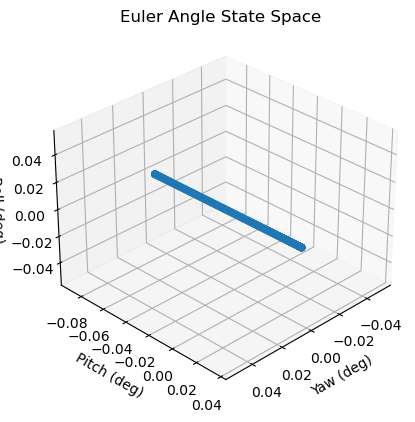

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(traj[:,0], traj[:,1], traj[:,2])
ax.set_xlabel("Yaw (deg)")
ax.set_ylabel("Pitch (deg)")
ax.set_zlabel("Roll (deg)")
ax.set_title("Euler Angle State Space")

ax.view_init(elev=30., azim=45)

In [ ]:
timestamp = datetime.now().strftime("%d%B%y_%HHrs")

name = (
    f"Lb_{params['Lb']}_"
    f"Lc_{params['Lc']}_"
    f"ma_{params['ma']}_"
    f"mb_{params['mb']}_"
    f"mc_{params['mc']}"
)

filename = f"3DOF_sim_{name}_{timestamp}.npz"

if False:
    np.savez(
        filename,
        time=time_viz,
        q=traj[:,0:3],
        qdot=traj[:,3:6],
        # tau=tau_history,
        # force=force_history,
        params=params
    )
    print(f"Saved data: {filename}")